In [30]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix

from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, BatchNormalization, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.models import Sequential, load_model

from imutils import paths
import matplotlib.pyplot as plt
import numpy as np
import argparse
import imutils
import cv2
import os
import seaborn as sn

In [31]:
# initialize the list of data and labels
data = []
labels = []

In [32]:
#loop over the input images
# imutils.paths.list_images : grab the image paths and randomly shuffle them
for imagePath in sorted(list(paths.list_images('datasetCNN'))):
    # print(imagePath)
    # load the image, pre-process it, and store it in the data list
    image = cv2.imread(imagePath)
    # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image = imutils.resize(image, width = 64)  #28
    image = img_to_array(image)
    data.append(image)

    # extract the class label from the image path and update the label list : negative, postive
    label = imagePath.split(os.path.sep)[-2]
    # print(label)

    # positive(smile : 1, no-smile : 0)
    label = 1 if label == "positives" else 0 
    labels.append(label)

In [33]:
# scale the raw pixel intensities to the range [0, 1]
data = np.array(data, dtype = "float") / 255.0
labels = np.array(labels)
print(labels.shape, data.shape)
print(labels)

(13165,) (13165, 64, 64, 3)
[0 0 0 ... 1 1 1]


In [65]:
# convert the labels from integers to vectors
# le = LabelEncoder().fit(labels)
# labels = to_categorical(le.transform(labels), 2)
# print(labels.shape)
# print(labels)

In [34]:
# partition the data into training and testing splits using 80% of the data
# for training and remaining 20% for testing
(trainX, testX, trainY, testY) = train_test_split(data, labels,
    test_size = 0.20, stratify = labels, random_state = 42)

# print(trainX.shape)
print(trainY.shape)

(10532,)


In [35]:
num_classes = 2

trainY = to_categorical(trainY, num_classes)
testY = to_categorical(testY, num_classes)
print(trainY.shape)
print(testY)

(10532, 2)
[[1. 0.]
 [0. 1.]
 [1. 0.]
 ...
 [0. 1.]
 [0. 1.]
 [0. 1.]]


In [56]:
print(trainX)
print(trainY)

[array([[[57., 57., 57.],
        [45., 45., 45.],
        [49., 49., 49.],
        ...,
        [47., 47., 47.],
        [45., 45., 45.],
        [44., 44., 44.]],

       [[59., 59., 59.],
        [46., 46., 46.],
        [49., 49., 49.],
        ...,
        [48., 48., 48.],
        [46., 46., 46.],
        [43., 43., 43.]],

       [[57., 57., 57.],
        [46., 46., 46.],
        [50., 50., 50.],
        ...,
        [47., 47., 47.],
        [45., 45., 45.],
        [41., 41., 41.]],

       ...,

       [[10., 10., 10.],
        [ 8.,  8.,  8.],
        [10., 10., 10.],
        ...,
        [19., 19., 19.],
        [18., 18., 18.],
        [18., 18., 18.]],

       [[18., 18., 18.],
        [ 9.,  9.,  9.],
        [ 8.,  8.,  8.],
        ...,
        [18., 18., 18.],
        [18., 18., 18.],
        [18., 18., 18.]],

       [[28., 28., 28.],
        [14., 14., 14.],
        [10., 10., 10.],
        ...,
        [17., 17., 17.],
        [18., 18., 18.],
        [19., 19., 19.]

In [20]:
print(trainX.shape)
print(trainY.shape)

(10532, 64, 64, 1)
(10532, 2)


In [36]:
'''
model = Sequential()
model.add(Conv2D(75, (3, 3), strides=1, padding="same", activation="relu", 
                 input_shape=(28, 28, 1)))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2), strides=2, padding="same"))

model.add(Conv2D(50, (3, 3), strides=1, padding="same", activation="relu"))
model.add(Dropout(0.2))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2), strides=2, padding="same"))

model.add(Conv2D(25, (3, 3), strides=1, padding="same", activation="relu"))
model.add(BatchNormalization())
model.add(MaxPooling2D((2, 2), strides=2, padding="same"))

model.add(Flatten())
model.add(Dense(units=512, activation="relu"))
model.add(Dropout(0.3))
model.add(Dense(units=2, activation="softmax"))

'''

# 특징 추출 부분
# 합성곱 층(Conv2D)와 풀링 층(MaxPooling2D)를 번갈아가며 사용
model = Sequential()
model.add(Conv2D(32, (3,3), padding='same', activation='relu', input_shape=(64,64,3)))
model.add(BatchNormalization())  
model.add(MaxPooling2D(2,2))
model.add(Dropout(0.3))  

model.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model.add(BatchNormalization())  
model.add(MaxPooling2D(2,2))
model.add(Dropout(0.3)) 

model.add(Conv2D(32, (3,3), padding='same', activation='relu'))
model.add(BatchNormalization())  
model.add(MaxPooling2D(2,2))

# 분류기 역할의 완전 연결 신경망
# 특징 추출 부분을 거쳐온 데이터를 신경망에 입력할 수 있도록 1차원으로 변환
model.add(Flatten())
model.add(Dense(500, activation='relu'))  # 128
# 10개의 클래스 분류이므로 출력층에 10개의 노드를, 활성화 함수로 softmax를 지정
model.add(Dropout(0.3))
model.add(Dense(2, activation='softmax'))



# model.add(Conv2D(20, (5, 5), padding = 'same', activation='relu', input_shape=(28,28,1)))
# model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))

# # second set of CONV => RELU => POOL layers
# model.add(Conv2D(50, (5, 5), padding = 'same', activation='relu'))
# model.add(MaxPooling2D(pool_size = (2, 2), strides = (2, 2)))

# # first set of FC => RELU layers
# model.add(Flatten())
# model.add(Dense(500, activation='relu'))

# # softmax classififer
# model.add(Dense(2, activation='softmax'))



In [37]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 64, 64, 32)        896       
                                                                 
 batch_normalization_6 (Batc  (None, 64, 64, 32)       128       
 hNormalization)                                                 
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 32, 32, 32)       0         
 2D)                                                             
                                                                 
 dropout_6 (Dropout)         (None, 32, 32, 32)        0         
                                                                 
 conv2d_7 (Conv2D)           (None, 32, 32, 32)        9248      
                                                                 
 batch_normalization_7 (Batc  (None, 32, 32, 32)      

In [38]:
model.compile(loss = "categorical_crossentropy", optimizer = "adam",
                metrics = ["accuracy"])

In [39]:
callback1 = EarlyStopping(monitor='val_loss', patience=3)
callback2 = ModelCheckpoint(filepath='./model/bestCNN_model.h5', 
                            monitor='val_loss',
                            save_best_only=True)

# callback = [EarlyStopping(monitor='val_loss',
#                                     patience=10),
#              ModelCheckpoint(filepath='./model/bestCNN_model.h5',
#                              monitor='val_loss',
#                              save_best_only=True)]

In [40]:

history = model.fit(trainX, trainY, 
                    epochs=30, 
                    validation_data = (testX, testY),
                    callbacks=[callback1, callback2])

Epoch 1/30
330/330 [==============================] - 40s 118ms/step - loss: 0.4959 - accuracy: 0.8232 - val_loss: 0.4258 - val_accuracy: 0.8086
Epoch 2/30
330/330 [==============================] - 40s 120ms/step - loss: 0.2777 - accuracy: 0.8865 - val_loss: 0.3383 - val_accuracy: 0.8542
Epoch 3/30
330/330 [==============================] - 40s 121ms/step - loss: 0.2361 - accuracy: 0.9035 - val_loss: 0.2563 - val_accuracy: 0.9104
Epoch 4/30
330/330 [==============================] - 40s 121ms/step - loss: 0.2118 - accuracy: 0.9139 - val_loss: 0.2706 - val_accuracy: 0.9035
Epoch 5/30
330/330 [==============================] - 41s 124ms/step - loss: 0.1991 - accuracy: 0.9201 - val_loss: 0.2389 - val_accuracy: 0.9153
Epoch 6/30
330/330 [==============================] - 40s 121ms/step - loss: 0.1897 - accuracy: 0.9227 - val_loss: 0.2418 - val_accuracy: 0.9111
Epoch 7/30
330/330 [==============================] - 40s 121ms/step - loss: 0.1695 - accuracy: 0.9320 - val_loss: 0.2715 - val_ac

In [77]:
print(history.history)
# save the model to disk
# model.save('model/model_cnn_drop_br_64.h5')


{'loss': [0.4334833025932312, 0.2804775834083557, 0.24573668837547302, 0.22381052374839783, 0.21000227332115173, 0.18836204707622528, 0.17550256848335266, 0.1543373465538025, 0.14338821172714233, 0.13725262880325317, 0.12741446495056152, 0.10992588102817535], 'accuracy': [0.8366881608963013, 0.8822636008262634, 0.8990694880485535, 0.9085643887519836, 0.9165400862693787, 0.9266995787620544, 0.9308773279190063, 0.940467119216919, 0.9446448683738708, 0.946164071559906, 0.9509115219116211, 0.9589821696281433], 'val_loss': [1.4973214864730835, 0.3453139066696167, 0.26114150881767273, 0.22410175204277039, 0.23256762325763702, 0.23171432316303253, 0.20714814960956573, 0.2213442325592041, 0.20157253742218018, 0.2602328062057495, 0.24952295422554016, 0.33098304271698], 'val_accuracy': [0.46165528893470764, 0.8826879262924194, 0.8948367238044739, 0.9233105778694153, 0.9145786166191101, 0.9058465957641602, 0.9339407682418823, 0.9274867177009583, 0.927107036113739, 0.9236901998519897, 0.9252088069

In [41]:
new_model = load_model('./model/bestCNN_model.h5')
test_loss, test_acc = new_model.evaluate(testX, testY)

83/83 [==============================] - 2s 28ms/step - loss: 0.2389 - accuracy: 0.9153


ValueError: x and y must have same first dimension, but have shapes (12,) and (8,)

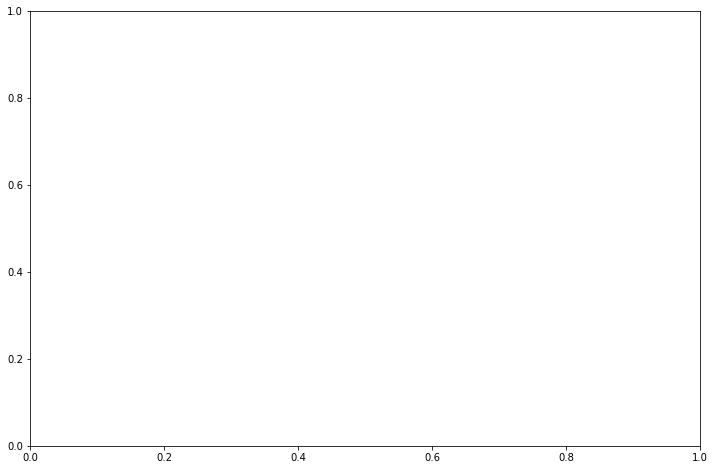

In [42]:
# plot the training + testing loss and accuracy
plt.figure(figsize=(12, 8))
plt.plot(np.arange(0, 12), history.history["loss"], label = "train_loss")
plt.plot(np.arange(0, 12), history.history["val_loss"], label = "val_loss")
plt.plot(np.arange(0, 12), history.history["accuracy"], label = "accuracy")
plt.plot(np.arange(0, 12), history.history["val_accuracy"], label = "val_accuracy")
plt.title("Training Loss and Accuracy")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend()
plt.savefig('output')
plt.show()


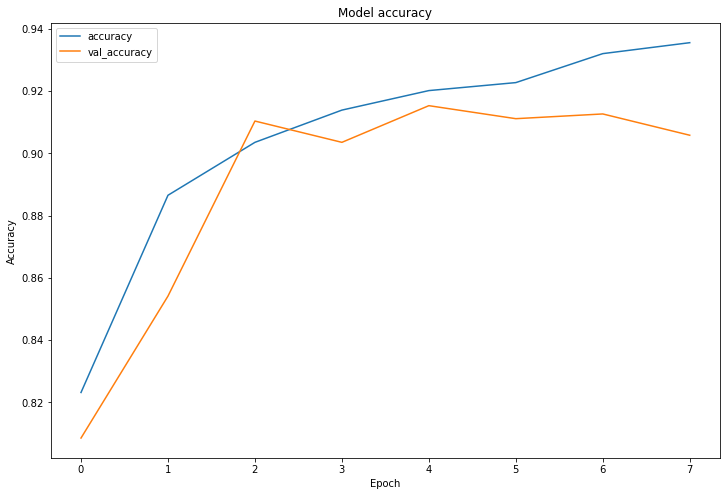

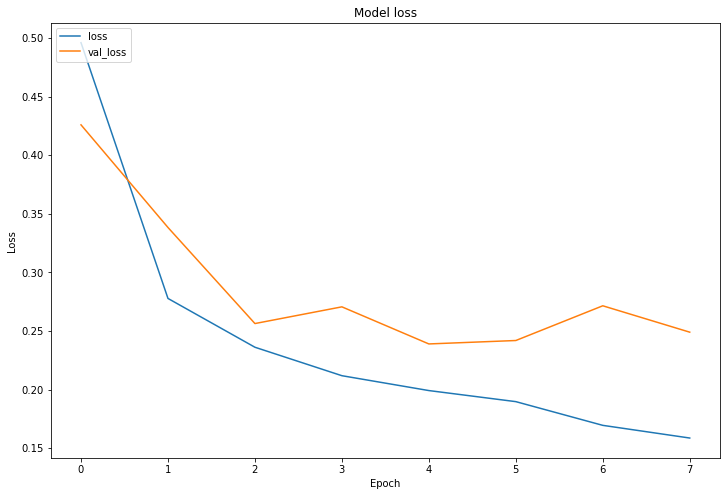

In [43]:
# 정확도
plt.figure(figsize=(12, 8))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['accuracy', 'val_accuracy'], loc='upper left')
plt.show()

# 손실
plt.figure(figsize=(12, 8))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['loss', 'val_loss'], loc='upper left')
plt.show()

In [44]:
import matplotlib.image as mpimg
from tensorflow.keras.preprocessing import image as image_utils
from tensorflow.keras.applications.imagenet_utils import preprocess_input

def show_image(image_path):
    image = mpimg.imread(image_path)
    # print(image.shape)
    plt.imshow(image)

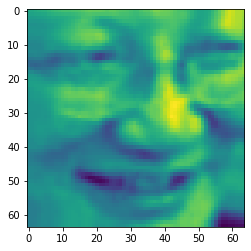

In [45]:
show_image('./datasetCNN/positives/10012.jpg')

In [3]:
def make_predictions(image_path):
    show_image(image_path)
    
    image = image_utils.load_img(image_path, target_size=(64, 64))
    image = image_utils.img_to_array(image)
    image = image.reshape(1,64,64,3)
    image = preprocess_input(image)
    preds = model.predict(image)
    return preds

In [4]:
classes = {0:'no-smile', 1:'smile'}

pred = make_predictions('./datasetCNN/positives/1000.jpg')
# pred = make_predictions('./testImg/08.png')
print(pred)
print(np.argmax(pred))
print(classes[np.argmax(pred)])

NameError: name 'show_image' is not defined

In [1]:
# pred = make_predictions('./datasetCNN/positives/100.jpg')
pred = make_predictions('./datasetCNN/positives/10046.jpg')
print(pred)
print(np.argmax(pred))
print(classes[np.argmax(pred)])

NameError: name 'make_predictions' is not defined